## Modelowanie układów przepływowych - ćwiczenia
#### (budowa solwera równań płytkiej wody na bazie pakietu PyMPDATA)

In [1]:
import sys
if 'google.colab' in sys.modules:
    !pip --quiet install open-atmos-jupyter-utils
    from open_atmos_jupyter_utils import pip_install_on_colab
    pip_install_on_colab('PyMPDATA-examples')

### 0. potrzebne pakiety Pythona

In [2]:
import numpy as np
from matplotlib import pyplot
from open_atmos_jupyter_utils import show_plot, show_anim
from PyMPDATA import ScalarField, Solver, Stepper, VectorField, Options, boundary_conditions

In [22]:
!pip install pint

In [23]:
import pint

### 1. opis układu: symbole i równania

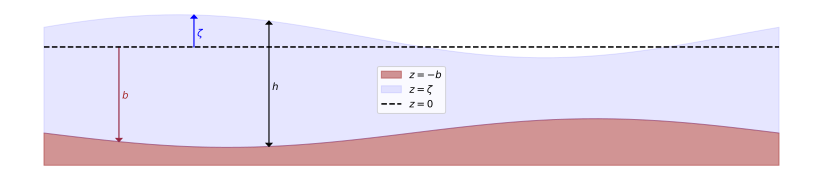

In [3]:
pyplot.figure(figsize=(14.5,3))
pyplot.axis('off')

x = np.linspace(-np.pi, np.pi)
z = np.cos(x+2)/2+.25
b = np.sin(x)/3-2

arrow_kwargs = {'length_includes_head': True, 'head_width': .05}

ix = 5; color='brown'; label='$b$'
pyplot.fill_between(x, b, -2.75, color=color, label=f'$z=-${label}', alpha=.5)
pyplot.arrow(x[ix], 0, 0, b[ix], color=color, **arrow_kwargs)
pyplot.annotate(f" {label}", xy=(x[ix], b[ix] + 1), color=color)

ix = 10; color='blue'; label=r'$\zeta$'
pyplot.fill_between(x, z, b, color=color, label=f'$z=${label}', alpha=.1)
pyplot.arrow(x[ix], 0, 0, z[ix], color=color, **arrow_kwargs)
pyplot.annotate(f" {label}", xy=(x[ix], z[ix] - .5), color=color)

ix = 15; color='black'; label='$h$'
pyplot.plot(x, np.full_like(x, 0), linestyle='--', color=color, label='$z=0$')
pyplot.arrow(x[ix], 0, 0, z[ix], color=color, **arrow_kwargs)
pyplot.arrow(x[ix], 0, 0, b[ix], color=color, **arrow_kwargs)
pyplot.annotate(f" {label}", xy=(x[ix], -1), color=color)

pyplot.legend(loc=10)
show_plot('symbols')

<!-- $$ \zeta(t; x,y) \rightarrow \text{wysokość swobodnej powierzchni względem geoidy (z=0)}$$
$$ b(x,y) \rightarrow \text{batymetria mierzona dodatnio w doół od geoidy}$$
$$ h(t; x,y) = \zeta + b \rightarrow \text{całkowita głębokość kolumny wody} $$
$$ \vec{u} = [u, v]$$
$$
\begin{cases}
  \partial_t h &=&\! -\nabla \cdot (\vec{u}h)\\
  \partial_t (hu) &=&\! -\nabla \cdot (\vec{u}hu) - gh\partial_x\zeta \\
  \partial_t (hv) &=&\! -\nabla \cdot (\vec{u}hv) - gh\partial_y\zeta
\end{cases}
$$ -->

### 2. solwer "hello-world" zbudowany na bazie PyMPDATA

In [4]:
class ShallowWaterEquationsIntegrator:
    def __init__(self, *, h_initial: np.ndarray, bathymetry: np.ndarray, options: Options = None):
        """ initializes the solvers for a given initial condition of `h` assuming zero momenta at t=0 """
        options = options or Options(nonoscillatory=True, infinite_gauge=True)
        self.bathymetry = bathymetry
        X, Y, grid = 0, 1, h_initial.shape
        stepper = Stepper(options=options, grid=grid)
        kwargs = {
            'boundary_conditions': [boundary_conditions.Constant(value=0)] * len(grid),
            'halo': options.n_halo,
        }
        advectees = {
            "h": ScalarField(h_initial, **kwargs),
            "uh": ScalarField(np.zeros(grid), **kwargs),
            "vh": ScalarField(np.zeros(grid), **kwargs),
            # "uh": ScalarField(uh_initial, **kwargs),
            # "vh": ScalarField(vh_initial, **kwargs),

        }
        self.advector = VectorField((
                np.zeros((grid[X] + 1, grid[Y])),
                np.zeros((grid[X], grid[Y] + 1))
            ), **kwargs
        )
        self.solvers = { k: Solver(stepper, v, self.advector) for k, v in advectees.items() }

    def __getitem__(self, key):
        """ returns `key` advectee field of the current solver state """
        return self.solvers[key].advectee.get()

    def _apply_half_rhs(self, *, key, axis, g_times_dt_over_dxy):
        """ applies half of the source term in the given direction """
        self[key][:] -= .5 * g_times_dt_over_dxy * self['h'] * np.gradient(self['h']-self.bathymetry, axis=axis)

    def _update_courant_numbers(self, *, axis, key, mask, dt_over_dxy):
        """ computes the Courant number component from fluid column height and momenta fields """
        velocity = np.where(mask, np.nan, 0)
        momentum = self[key]
        np.divide(momentum, self['h'], where=mask, out=velocity)

        # using slices to ensure views (over copies)
        all = slice(None, None)
        all_but_last = slice(None, -1)
        all_but_first_and_last = slice(1, -1)

        velocity_at_cell_boundaries = velocity[(
            (all_but_last, all),
            (all, all_but_last),
        )[axis]] + np.diff(velocity, axis=axis) / 2
        courant_number = self.advector.get_component(axis)[(
            (all_but_first_and_last, all),
            (all, all_but_first_and_last)
        )[axis]]
        courant_number[:] = velocity_at_cell_boundaries * dt_over_dxy[axis]
        assert np.amax(np.abs(courant_number)) <= 1

    def __call__(self, *, nt: int, g: float, dt_over_dxy: tuple, outfreq: int, eps: float=1e-7):
        """ integrates `nt` timesteps and returns a dictionary of solver states recorded every `outfreq` step[s] """
        output = {k: [] for k in self.solvers.keys()}
        for it in range(nt + 1):
            if it != 0:
                mask = self['h'] > eps
                for axis, key in enumerate(("uh", "vh")):
                    self._update_courant_numbers(axis=axis, key=key, mask=mask, dt_over_dxy=dt_over_dxy)
                self.solvers["h"].advance(n_steps=1)
                for axis, key in enumerate(("uh", "vh")):
                    self._apply_half_rhs(key=key, axis=axis, g_times_dt_over_dxy=g * dt_over_dxy[axis])
                    self.solvers[key].advance(n_steps=1)
                    self._apply_half_rhs(key=key, axis=axis, g_times_dt_over_dxy=g * dt_over_dxy[axis])
            if it % outfreq == 0:
                for key in self.solvers.keys():
                    output[key].append(self[key].copy())
        return output

### 3. Projekt rozwiazanie - koryto rzeki

In [24]:
si = pint.UnitRegistry()

**Funkcje pomocnicze**

make_river - Funkcja tworzaca koryto rzeki (bathymetrie). Rzeka to krzywa gaussa z zmiennym srodkiem (river_center) opisanym funkcja sinusoidalna. Funkcja przyjmuje argumenty okreslajace rzeke:
*   szerokosc (river_width) - odchylenie gaussa,
*   glebokosc (river_depth) - amplituda gaussa,
*   wielkosc wychylen meandr (meander_ampl) - amplituda sinusa,
*   ilosc meandr (meander_freq) - czestotliwosc sinusa.

Zwraca bathymetrie (bathymetry_with_river) oraz maske (granice koryta).

make_inflow_wave - Funkcja ktora tworzy fale poczatkowa na wejsciu koryta rzeki. Do wyboru sa 3 rozne fale, okreslone parametrem 'mode':

        "gauss"        – Gauss dopasowany do przekroju rzeki
        "flat"         – płaska fala w korycie
        "flat_tapered" – płaska fala z łagodnym wprowadzeniem - bardziej realistyczna
Zwraca 'zete', czyli poczatkowe zaburzenie, ktore potem dodajemy do 'h_initial'.




In [55]:
def make_river(bathymetry, grid,
               river_width,
               river_depth,
               meander_ampl,
               meander_freq):

    Ny, Nx = grid
    x = np.arange(Nx)
    y = np.arange(Ny)

    # 1. meandrujący środek rzeki
    river_center_x = Nx//2 + meander_ampl * np.sin(meander_freq * y)

    # 2. tworzenie koryta + maski
    bath = bathymetry.copy()
    mask = np.zeros_like(bath, dtype=bool)

    for j in range(Ny):
        profile = river_depth * np.exp(-((x - river_center_x[j])**2) /
                                       (2*river_width**2))
        bath[j] -= profile
        mask[j] = profile > 0.01 * river_depth

    return bath, mask, river_center_x

def make_inflow_wave(grid, channel_mask, mode="gauss",
                     profile_0=None,
                     river_depth=1.0,
                     amplitude=0.2,
                     taper_rows=6):

    Ny, Nx = grid
    zeta = np.zeros((Ny, Nx))

    if mode == "gauss":
        zeta[0, channel_mask] = amplitude * profile_0[channel_mask] / river_depth
        return zeta

    if mode == "flat":
        zeta[0, channel_mask] = amplitude
        return zeta

    if mode == "flat_tapered":
        for j in range(min(taper_rows, Ny)):
            weight = 0.5 * (1 - np.cos(np.pi * (j+1) / taper_rows))
            zeta[j, channel_mask] = amplitude * weight
        return zeta

    raise ValueError(f"Unknown mode '{mode}'.")

Najpier definiujemy siatke i jej wielkosc. X w tym przypadku jest dlugoscia wzludz ktorej ciagnie sie rzeka, Y jest w jej poprzek.

Definiujemy bazowa bathymetrie o lekkim spadku, a nastepnie tworzymy koryto rzeki.

Nastepnie zadajemy fale poczatkowa.

Na koncu tworzymy poczatkowy stan wody i uruchamiamy integrator.

In [121]:
import numpy as np
import numba
numba.set_num_threads(1)

# ================================
# 1. Siatka
# ================================
si = pint.UnitRegistry()
grid = (150, 140)

# współrzędne do bathymetrii (0..1)
x_lin = np.linspace(0, 1, grid[1])
y_lin = np.linspace(0, 1, grid[0])
X, Y = np.meshgrid(x_lin, y_lin)

# bazowa bathymetria – lekki spadek wzdluz kierunku przeplywu
bathymetry = (0.5 - 0.1 * Y)


# ================================
# 2. Geometria rzeki (meandry)
# ================================
river_width  = grid[1] / 10     # szerokość koryta
river_depth  = 0.3              # głębokość koryta
meander_ampl = grid[1] / 8      # amplituda meandru
meander_freq = 2*np.pi / grid[0]        # 1 pełen meander na wysokość domeny

# ================================
# 3. Budowa rzeki (koryta) - bathymetrii
# ================================
bathymetry_with_river, channel_mask_full, river_center_x = make_river(
    bathymetry,
    grid,
    river_width,
    river_depth,
    meander_ampl,
    meander_freq
)

# ================================
# 4. Początkowe zaburzenie wody (fala wejściowa)
# ================================

# channel_mask dla wiersza 0
channel_mask = channel_mask_full[0, :]
profile_0 = river_depth * np.exp(-((x_lin - river_center_x[0])**2) / (2*river_width**2))


zeta = make_inflow_wave(grid, channel_mask,
    mode="flat_tapered",
    profile_0=profile_0,
    river_depth=river_depth,
    amplitude=0.2,
)

# ================================
# 5. Początkowy stan wody
# ================================
h_initial = bathymetry_with_river + zeta

# ================================
# 6. Integracja SW
# ================================
output05 = ShallowWaterEquationsIntegrator(
    h_initial=h_initial, bathymetry=bathymetry_with_river
)(
    nt=300, g=10, dt_over_dxy=(0.05, 0.05), outfreq=(outfreq := 3)
)

output30 = ShallowWaterEquationsIntegrator(
    h_initial=h_initial, bathymetry=bathymetry_with_river
)(
    nt=300, g=10, dt_over_dxy=(0.3, 0.3), outfreq=(outfreq := 3)
)


Przed wykonaniem animacji, warto sprawdzic oraz zaznajomic sie obrazowo z poczatkowa fala. Narysujemy przekroj fali na wejsciu (zeta[0,:]), a takze rzut z gory na koryto rzeki wraz z poczatkowa fala na wejsciu.

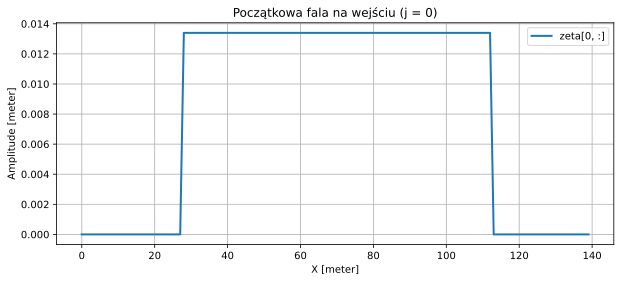

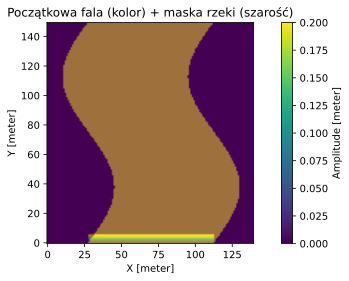

In [148]:
import pint
si = pint.UnitRegistry()

pyplot.figure(figsize=(10, 4))
pyplot.plot(zeta[0], label="zeta[0, :]", linewidth=2)
pyplot.title("Początkowa fala na wejściu (j = 0)")
pyplot.xlabel(f"X [{si.m}]")
pyplot.ylabel(f"Amplitude [{si.m}]")
pyplot.grid(True)
pyplot.legend()
pyplot.show()

pyplot.figure(figsize=(10, 4))

im = pyplot.imshow(zeta, origin='lower', cmap='viridis')
cbar = pyplot.colorbar(im)
cbar.set_label(f"Amplitude [{si.m}]")
pyplot.imshow(channel_mask_full, origin='lower', alpha=0.7)

pyplot.title("Początkowa fala (kolor) + maska rzeki (szarość)")
pyplot.xlabel(f"X [{si.m}]")
pyplot.ylabel(f"Y [{si.m}]")
pyplot.show()


### 4. Wizualizacja

<>:9: SyntaxWarning: invalid escape sequence '\z'
<>:9: SyntaxWarning: invalid escape sequence '\z'
/tmp/ipython-input-809848925.py:9: SyntaxWarning: invalid escape sequence '\z'
  ax.set(zlim=zlim, proj_type='ortho', title=f"t / Δt = {frame*outfreq}", zlabel=f"$\zeta$ [{si.m}]")



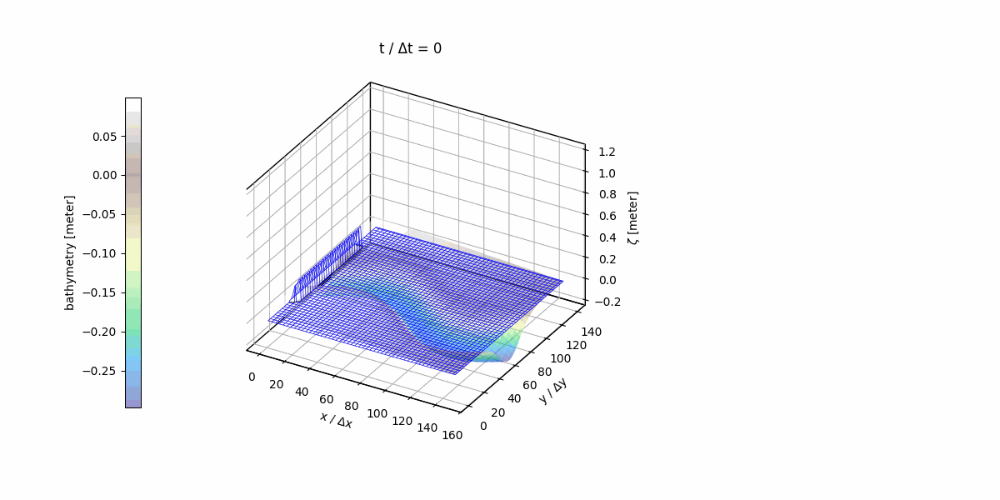

Button(description='tmpkpq3nb9y.gif', style=ButtonStyle())

In [143]:
def plot(frame, *, zlim=(-.25, 1.25)):

    psi = output30['h'][frame]
    water_height = (psi - bathymetry_with_river) * channel_mask_full

    xi, yi = np.indices(psi.shape)
    fig, ax = pyplot.subplots(subplot_kw={"projection": "3d"}, figsize=(12, 6))
    ax.plot_wireframe(xi+.5, yi+.5, water_height, color='blue', linewidth=.5)
    ax.set(zlim=zlim, proj_type='ortho', title=f"t / Δt = {frame*outfreq}", zlabel=f"$\zeta$ [{si.m}]")


    for axis in (ax.xaxis, ax.yaxis, ax.zaxis):
        axis.pane.fill = False
        axis.pane.set_edgecolor('black')
        axis.pane.set_alpha(1)
    for axis in ('x', 'y'):
        getattr(ax, f'set_{axis}label')(f"{axis} / Δ{axis}")
    # pyplot.colorbar(
    #     ax.contourf(xi+.5, yi+.5, bathymetry_with_river, zdir='z', offset=zlim[0]),
    #     pad=.1, aspect=10, fraction=.02, label='bathymetry', location='left'
    # ).ax.invert_yaxis()
    surf = ax.plot_surface(xi+.5, yi+.5, bathymetry_with_river-0.4, cmap='terrain', alpha=0.5)
    pyplot.colorbar(surf, pad=.1, fraction=.02, label=f'bathymetry [{si.m}]', location='left')
    ax.contour(xi+.5, yi+.5, water_height, levels=[0], colors='black', linewidths=1.5)


    return fig
show_anim(plot, range(len(output30['h'])))


Rzut na rzeke z gory - klatka 10. Widac poczatkowe zaburzenie ktore zaczyna rozchodzic sie wzluz koryta. Czarne kontury odzwierciedalaja miejsca w ktorych fala osiaga maske koryta (ustalona z gory wysokosc nad ktora woda nie powinna sie wydostawac).

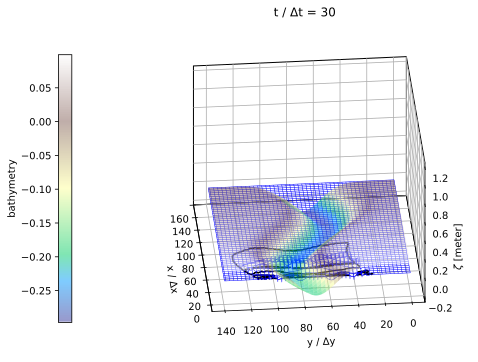

In [142]:
frame_to_show = 10
fig = plot(frame_to_show)
ax = fig.axes[0]
ax.view_init(elev=30, azim=175)
show_plot("Rzut_na_rzeke_klatka10.pdf")
pyplot.show()

Rzut na rzeke z gory - klatka 60.

Na tej klatce woda wciąż reaguje na wejściową perturbację, a kształt fali jest kształtowany przez meandry koryta.

Można przewidzieć, że w kolejnych klatkach fala rozprzestrzeni się i wygładzi.



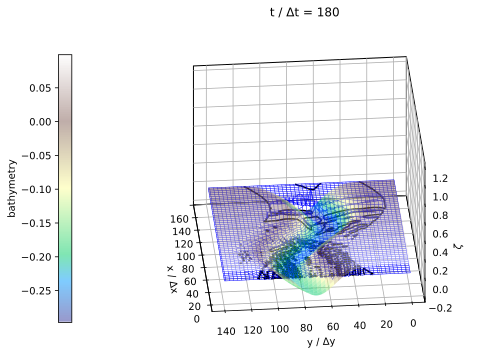

In [124]:
frame_to_show = 60
fig = plot(frame_to_show)
ax = fig.axes[0]
ax.view_init(elev=30, azim=175)
show_plot("Rzut_na_rzeke_klatka60.pdf")
pyplot.show()

Na tym rysunku widzimy jak fala rozprzestrzenia sie wzdluz rzeki. Widac to po jej grzbiecie - mocniejszy niebieski.

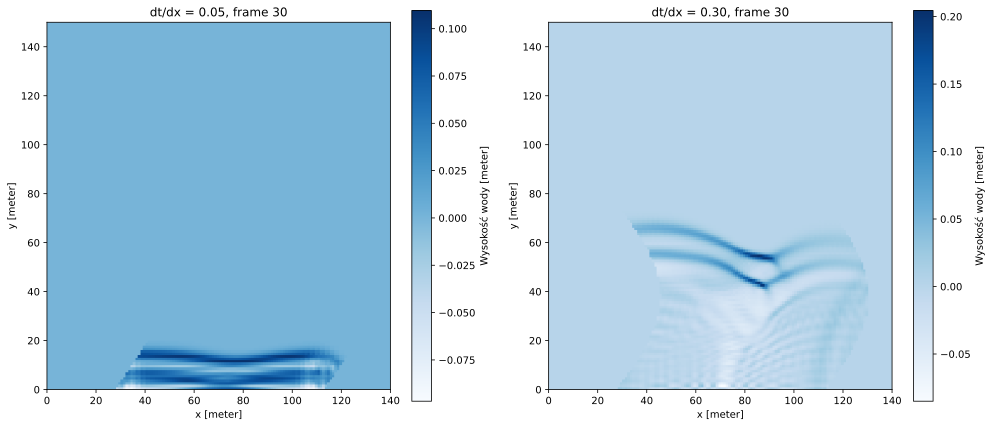

In [145]:
frame_to_show = 30

dzeta05 = (output05['h'][frame_to_show] - bathymetry_with_river) * channel_mask_full
dzeta30 = (output30['h'][frame_to_show] - bathymetry_with_river) * channel_mask_full
fig, axes = pyplot.subplots(1, 2, figsize=(14,6))  # 1 wiersz, 2 kolumny
# 0.15
im1 = axes[0].imshow(dzeta05, origin='lower', cmap='Blues', extent=[0, grid[1], 0, grid[0]])
axes[0].set_title(f'dt/dx = 0.05, frame {frame_to_show}')
axes[0].set_xlabel(f'x [{si.m}]')
axes[0].set_ylabel(f'y [{si.m}]')
fig.colorbar(im1, ax=axes[0], label=f'Wysokość wody [{si.m}]')
# 0.3
im2 = axes[1].imshow(dzeta30, origin='lower', cmap='Blues', extent=[0, grid[1], 0, grid[0]])
axes[1].set_title(f'dt/dx = 0.30, frame {frame_to_show}')
axes[1].set_xlabel(f'x [{si.m}]')
axes[1].set_ylabel(f'y [{si.m}]')
fig.colorbar(im2, ax=axes[1], label=f'Wysokość wody [{si.m}]')
pyplot.tight_layout()
pyplot.show()


Po pelnym czasie obliczen, woda w korycie sie stabilizuje.

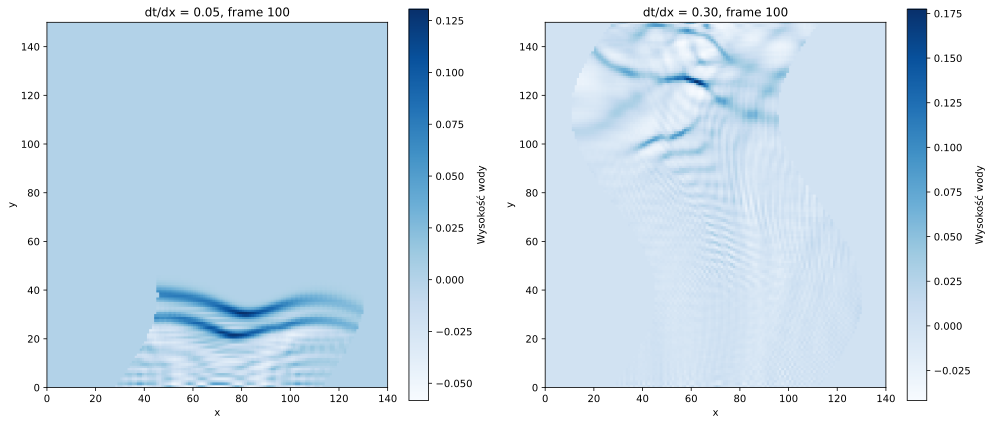

In [138]:
frame_to_show = 100

dzeta05 = (output05['h'][frame_to_show] - bathymetry_with_river) * channel_mask_full
dzeta30 = (output30['h'][frame_to_show] - bathymetry_with_river) * channel_mask_full
fig, axes = pyplot.subplots(1, 2, figsize=(14,6))  # 1 wiersz, 2 kolumny
# 0.15
im1 = axes[0].imshow(dzeta05, origin='lower', cmap='Blues', extent=[0, grid[1], 0, grid[0]])
axes[0].set_title(f'dt/dx = 0.05, frame {frame_to_show}')
axes[0].set_xlabel(f'x [{si.m}]')
axes[0].set_ylabel(f'y [{si.m}]')
fig.colorbar(im1, ax=axes[0], label=f'Wysokość wody [{si.m}]')
# 0.3
im2 = axes[1].imshow(dzeta30, origin='lower', cmap='Blues', extent=[0, grid[1], 0, grid[0]])
axes[1].set_title(f'dt/dx = 0.30, frame {frame_to_show}')
axes[1].set_xlabel(f'x [{si.m}]')
axes[1].set_ylabel(f'y [{si.m}]')
fig.colorbar(im2, ax=axes[1], label=f'Wysokość wody [{si.m}]')
pyplot.tight_layout()
pyplot.show()


Pole predkosci w kroku 50. Widzimy bardzo duzy 'chaos', tworza sie nawet lekkie, krotkotrwale wiry.

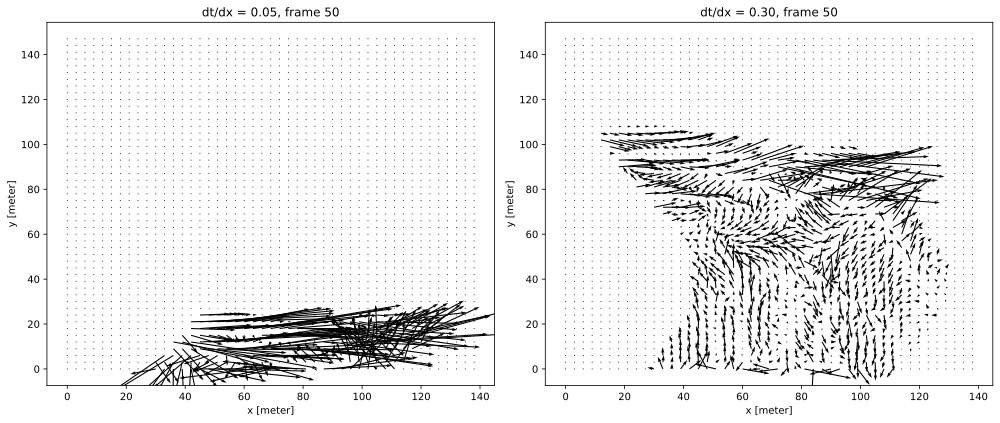

In [146]:
frame_to_show = 50
step = 3

U15 = output05['uh'][frame_to_show] * channel_mask_full
V15 = output05['vh'][frame_to_show] * channel_mask_full
U30 = output30['uh'][frame_to_show] * channel_mask_full
V30 = output30['vh'][frame_to_show] * channel_mask_full

X, Y = np.meshgrid(np.arange(U15.shape[1]), np.arange(U15.shape[0]))
X_sample = X[::step, ::step]
Y_sample = Y[::step, ::step]

U15_sample = U15[::step, ::step]
V15_sample = V15[::step, ::step]
U30_sample = U30[::step, ::step]
V30_sample = V30[::step, ::step]

fig, axes = pyplot.subplots(1, 2, figsize=(14,6))
# 0.05
axes[0].quiver(X_sample, Y_sample, U15_sample, V15_sample)
axes[0].set_title(f'dt/dx = 0.05, frame {frame_to_show}')
axes[0].set_xlabel(f'x [{si.m}]')
axes[0].set_ylabel(f'y [{si.m}]')
# 0.3
axes[1].quiver(X_sample, Y_sample, U30_sample, V30_sample)
axes[1].set_title(f'dt/dx = 0.30, frame {frame_to_show}')
axes[1].set_xlabel(f'x [{si.m}]')
axes[1].set_ylabel(f'y [{si.m}]')
pyplot.tight_layout()
pyplot.show()


Po pelnym czasie integracji, rzeka sie stabilizuje. Predkosc maleje.

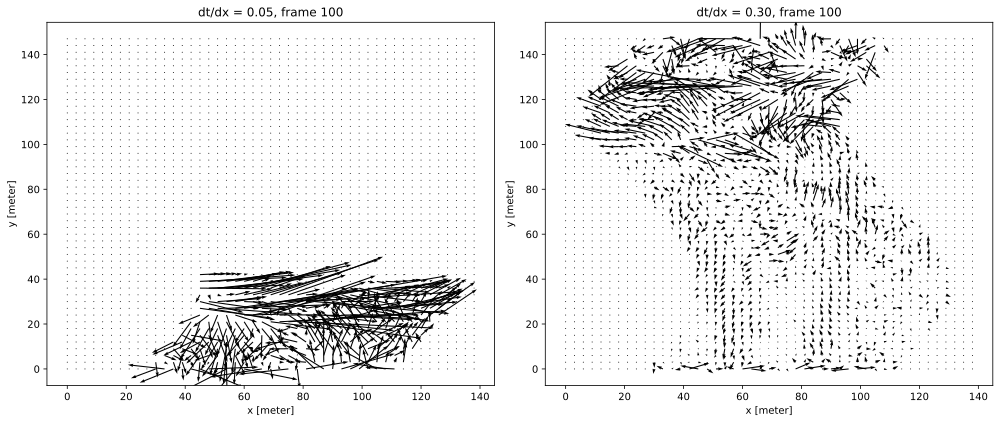

In [147]:
frame_to_show = 100
step = 3

U05 = output05['uh'][frame_to_show] * channel_mask_full
V05 = output05['vh'][frame_to_show] * channel_mask_full
U30 = output30['uh'][frame_to_show] * channel_mask_full
V30 = output30['vh'][frame_to_show] * channel_mask_full

X, Y = np.meshgrid(np.arange(U05.shape[1]), np.arange(U05.shape[0]))
X_sample = X[::step, ::step]
Y_sample = Y[::step, ::step]

U05_sample = U05[::step, ::step]
V05_sample = V05[::step, ::step]
U30_sample = U30[::step, ::step]
V30_sample = V30[::step, ::step]

fig, axes = pyplot.subplots(1, 2, figsize=(14,6))
# 0.05
axes[0].quiver(X_sample, Y_sample, U05_sample, V05_sample)
axes[0].set_title(f'dt/dx = 0.05, frame {frame_to_show}')
axes[0].set_xlabel(f'x [{si.m}]')
axes[0].set_ylabel(f'y [{si.m}]')
# 0.3
axes[1].quiver(X_sample, Y_sample, U30_sample, V30_sample)
axes[1].set_title(f'dt/dx = 0.30, frame {frame_to_show}')
axes[1].set_xlabel(f'x [{si.m}]')
axes[1].set_ylabel(f'y [{si.m}]')
pyplot.tight_layout()
pyplot.show()

### 5. Wnioski

Początkowa fala jest dobrze odwzorowana w korycie rzeki, z łagodnym wprowadzeniem dzięki "flat_tapered".

Meandry koryta wpływają na kształt i propagację fali w czasie.

Pole prędkości w fazie początkowej jest niestabilne i tworzy wiry.

Z czasem rzeka i przepływ stabilizują się, prędkości maleją, fala wygładza się.

Większy krok czasowy (dt/dx=0.3) daje szybszą symulację, ale trzeba uważać na stabilność; mniejszy krok (dt/dx=0.05) jest dokładniejszy, ale wolniejszy.